# Project "Gold recovery"

<h1>Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Project description" data-toc-modified-id="Project-description-0"><span class="toc-item-num">0&nbsp;&nbsp;</span>Project description</a></span></li><li><span><a href="#Import-libraries" data-toc-modified-id="Import-libraries-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import libraries</a></span></li><li><span><a href="#Data-preparation" data-toc-modified-id="Data-preparation-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data preparation</a></span><ul class="toc-item"><li><span><a href="#Data-loading" data-toc-modified-id="Data-loading-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Data loading</a></span></li><li><span><a href="#Data-dimension-analysis" data-toc-modified-id="Data-dimension-analysis-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Data dimension analysis</a></span><ul class="toc-item"><li><span><a href="#Dimension-comparison" data-toc-modified-id="Dimension-comparison-2.2.1"><span class="toc-item-num">2.2.1&nbsp;&nbsp;</span>Dimension comparison</a></span></li></ul></li><li><span><a href="#Discarded-feature-analysis" data-toc-modified-id="Discarded-feature-analysis-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Discarded feature analysis</a></span><ul class="toc-item"><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-2.3.1"><span class="toc-item-num">2.3.1&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></li><li><span><a href="#Calculation-check" data-toc-modified-id="Calculation-check-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Calculation-check</a></span></li><li><span><a href="#Sampling" data-toc-modified-id="Sampling-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Sampling</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></li><li><span><a href="#Data-Analysis" data-toc-modified-id="Data-Analysis-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Data Analysis</a></span><ul class="toc-item"><li><span><a href="#Measure-metal-concentration" data-toc-modified-id="Measure-metal-concentration-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Measure metal concentration</a></span></li></ul></li><li><span><a href="#Granule-size-distribution" data-toc-modified-id="Granule-size-distribution-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Granule size distribution</a></span><ul class="toc-item"><li><span><a href="#Total-concentration" data-toc-modified-id="Total-concentration-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Total concentration</a></span></li></ul></li><li><span><a href="#Gap-handling" data-toc-modified-id="Gap-handling-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Gap handling</a></span><ul class="toc-item"><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></li><li><span><a href="#Models" data-toc-modified-id="Models-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Models</a></span><ul class="toc-item"><li><span><a href="#Pipeline-and-gridsearch" data-toc-modified-id="Pipeline-and-gridsearch-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Pipeline and gridsearch</a></span></li><li><span><a href="#Quality-metrics" data-toc-modified-id="Quality-metrics-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Quality metrics</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></li></ul></div>

# Project description

A prototype machine learning model for Zifra, a company that develops solutions for efficient operation of industrial enterprises.

The model should predict the recovery rate of gold from gold ore. Data on extraction and cleaning parameters is available.

The model will help optimize production so as not to launch potentially unprofitable enterprise.

# Import libraries

In [9]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error

# Data preparation

## Data loading

In [10]:
df_train = pd.read_csv('gold_recovery_train.csv',index_col = 'date')

In [11]:
df_test = pd.read_csv('gold_recovery_test.csv',index_col = 'date')

In [12]:
df_full = pd.read_csv('gold_recovery_full.csv',index_col = 'date')

## Data dimension analysis

In [13]:
df_train.shape

(16860, 86)

In [14]:
df_test.shape

(5856, 52)

In [15]:
df_full.shape

(22716, 86)

### Dimension comparison

In [16]:
df_train.shape[0] + df_test.shape[0] == df_full.shape[0] # dimension ok

True

## Discarded features analysis

There are discarded features in df_test

In [17]:
# List of discarded features
set(list(df_train)) - set(list(df_test))

{'final.output.concentrate_ag',
 'final.output.concentrate_au',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_au',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'rougher.calculation.au_pb_ratio',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_au',
 'rougher.output.ta

### Conclusion

We can conclude that the test data is missing:
* Signs of the release of the concentration of metals at the final and (as well as the stage of primary purification)
* Signs of tailings at the final and stage (as well as the stage of primary treatment)
* Estimated characteristics for flotation (rougher.calculation)

and many other features

## Calculations check

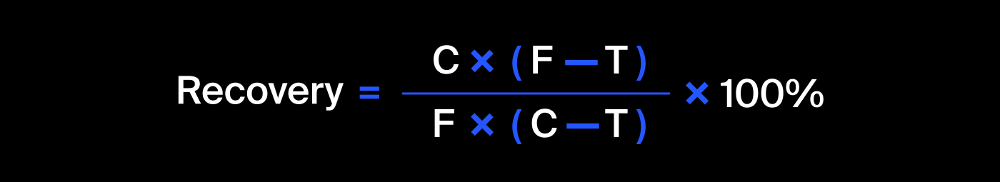

where:

     C is the proportion of gold in the concentrate after flotation/refining;
     F is the share of gold in the raw material/concentrate before flotation/refining;
     T is the proportion of gold in tailings after flotation/cleaning.

In [18]:
# function for calculating the enrichment efficiency
def recovery(row):
    F = row['rougher.input.feed_au'] # part of gold before 
    C = row['rougher.output.concentrate_au'] # part of gold after
    T = row['rougher.output.tail_au'] # part of gold in tails
    
    # Formula parts
    numerator = C * (F-T)
    denominator = F * (C-T)
    recovery = numerator/denominator * 100
    
    # Conditions
    if F == 0:
        return np.nan
    if denominator == 0:
        return 100

    # Correction of recovery value
    if recovery > 100:
        recovery = 100
    elif recovery < 0:
        recovery = 0
        
    return recovery

In [19]:
recovery = df_train.apply(recovery,axis = 1)

/var/folders/ck/3npmnx597nb730qdy5w_6kp00000gn/T/ipykernel_58696/1708323933.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  recovery = numerator/denominator * 100
/var/folders/ck/3npmnx597nb730qdy5w_6kp00000gn/T/ipykernel_58696/1708323933.py:10: RuntimeWarning: invalid value encountered in double_scalars
  recovery = numerator/denominator * 100


Сравним значения recovery, но прежде проверим в данных признаках пробелы

In [20]:
print(recovery.isna().sum())
df_train['rougher.output.recovery'].isna().sum()

2313


2573

In [21]:
pd.DataFrame(
    {'rougher.output.recovery':df_train['rougher.output.recovery'],'calculated_recovery':recovery}
)

,rougher.output.recovery,calculated_recovery
date,,
2016-01-15 00:00:00,87.107763,87.107763
2016-01-15 01:00:00,86.843261,86.843261
2016-01-15 02:00:00,86.842308,86.842308
2016-01-15 03:00:00,87.226430,87.226430
2016-01-15 04:00:00,86.688794,86.688794
...,...,...
2018-08-18 06:59:59,89.574376,89.574376
2018-08-18 07:59:59,87.724007,87.724007
2018-08-18 08:59:59,88.890579,88.890579


Visually, the values do not differ. Let's calculate the MAE

In [22]:
mean_absolute_error(
    df_train['rougher.output.recovery'].fillna(0),recovery.fillna(0)
)

0.7354685646500673

Gap analysis

In [23]:
df_test.isna().sum().sum()

2360

In [24]:
df_train.isna().sum().sum()

30320

As we can see, there are many more gaps in the test data

In [25]:
# Function for gap analysis

def null_values(df):
    result = pd.DataFrame(
        df.isna().sum().sort_values(ascending = False).head(10)/df.shape[0]
    )
    
    result.columns = ['null_values,%']
    return result

In [26]:
df_train.name = 'df_train'
df_test.name = 'df_test'
for df in [df_train,df_test]:
    print(df.name)
    display(null_values(df))
    print('\n')

df_train


,"null_values,%"
rougher.output.recovery,0.152610
rougher.output.tail_ag,0.133452
rougher.output.tail_sol,0.133393
rougher.output.tail_au,0.133393
secondary_cleaner.output.tail_sol,0.117794
rougher.input.floatbank11_xanthate,0.112930
final.output.recovery,0.090214
primary_cleaner.input.sulfate,0.077521
primary_cleaner.input.depressant,0.074852
rougher.calculation.au_pb_ratio,0.073665




df_test


,"null_values,%"
rougher.input.floatbank11_xanthate,0.060280
primary_cleaner.input.sulfate,0.051571
primary_cleaner.input.depressant,0.048497
rougher.input.floatbank10_sulfate,0.043887
primary_cleaner.input.xanthate,0.028347
rougher.input.floatbank10_xanthate,0.021004
rougher.input.feed_sol,0.011441
rougher.input.floatbank11_sulfate,0.009392
rougher.input.feed_rate,0.006831
secondary_cleaner.state.floatbank3_a_air,0.005806


The largest number of missing values falls on the target variable.

## Sampling

In [27]:
X_train = df_train[df_test.columns]

In [28]:
y_train_final = df_train['final.output.recovery']

In [29]:
y_train_rougher = df_train['rougher.output.recovery']

## Conclusion
Data loaded and studied. There are gaps in the data, and there are no "output" features in the test sample. There are gaps in the data that will be processed later.

# Data Analysis

Functions for finding axes borders

In [30]:
pip install plotly


[notice] A new release of pip available: 22.2 -> 22.3
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [31]:
import plotly.graph_objects as go

In [32]:
def find_xrange(df,stages,metals):
    # Start positions for х
    xmax = 0
    xmin = 100
    # Cycle for each category
    for stage in stages:
        for metal in metals:
            
            # Max value of х
            range_max = np.ceil(df[stage + '_' + metal].max())
            if range_max > xmax:
                xmax = range_max
                
            # Min value of х    
            range_min = np.ceil(df[stage + '_' + metal].min())
            if range_min < xmin:
                xmin = range_min
    return xmin,xmax

In [33]:
def find_yrange(df, stages, metals, xrange, bins_size):
    # Start positions for у
    ymax = 0
    ymin = 0
    # Cycle for each category
    for stage in stages:
        for metal in metals:
            # Max value from histogram
            counts,_ = np.histogram(df_train[stage + '_' + metal].dropna(),
                                    bins = range(int(xrange[0]),int(np.ceil(xrange[1])),
                                                 bins_size))
            range_max = np.ceil(counts.max())
            
            if range_max > ymax:
                ymax = range_max
                
    ymax = int(1.1 * ymax)
    
    return ymin, ymax

In [34]:
def plot(df,
         stages,
         metals,
         mode = 'boxplot',
         title = 'Distribution of metal concentration at different stages of processing',
         bins_size = 1):

    """
    The function builds an animated histogram or boxplot for metals
     at different stages of cleaning

    Variable        | Type      | Description

    df              | Dataframe | # Data
    stages          | list      | # Stage
    metals          | list      | # Metals
    mode            | str       | # Type of plot
    title           | str       | # Title
    bins_size       | int       | # Number of bins
    """
    metals_name = {'au': 'Gold', 'ag': 'Silver',
                   'pb': 'Lead', 'sol': 'Other'}
    metal_colors = {'au': '#FFC125', 'ag': '#C0C0C0',
                    'pb': '#4682B4', 'sol': '#8B658B'}
    
    # Empty lists to store animation frames and steps for the slider
    frames = []
    slider_steps = []
    
    # Find the range of possible values for x using the function that we wrote above
    xrange = find_xrange(df,stages,metals)
    
    # For different types of charts, we will create the corresponding figures with the initial state
    # Shape for scatterplot
    if mode.lower() in 'boxplot':
        fig = go.Figure(data = [go.Box(x = df[stages[0] + '_' + metal],
                                      name = metals_name[metal],
                                      marker_color = metal_colors[metal]) for metal in metals])
        
        # Axis у
        yrange = [-.5,len(metals)-.5]
    
    # Shape for histogram
    elif mode.lower() in 'histogram':
        fig = go.Figure(data = [go.Histogram(x = df[stages[0] + '_' + metal],
                                             name = metals_name[metal],
                                            xbins = dict(start=xrange[0],
                                                        end = xrange[1],
                                                        size = bins_size),
                                             marker_color = metal_colors[metal]) for metal in metals])
        
        # For the histogram, we set the range of values along the y-axis, taking into account the maximum frequency among all bins
        yrange = find_yrange(df, stages, metals, xrange, bins_size=bins_size)

        
    else:
        # Return a warning that one of 2 values must be entered
        print('mode must be "boxplot" or "hist"')
        return None
        
    for stage in stages:
        # For each stage, create a corresponding frame 
        if mode.lower() in 'boxplot':
            frame_data = [go.Box(x = df[stage + '_' + metal],
                                 marker_color = metal_colors[metal]) for metal in metals]
            
        elif mode.lower() in 'histogram':
            frame_data = [go.Histogram(x = df[stage + '_' + metal],
                                        xbins = dict(start = xrange[0],
                                                    end = xrange[1],
                                                    size = bins_size),
                                        marker_color = metal_colors[metal]) for metal in metals]
            
        # Adding a frame to the frame List
        frame = go.Frame(data = frame_data, name = stage)
        frames.append(frame)
        
        # For each stage, create the corresponding slider step
        slider_step = dict(method = 'animate',
                           label = stage,
                           value = stage,
                           args = [
                               [stage],
                               dict(frame = dict(duration = 300, redraw = True),
                                    mode = 'immediate',
                                    transition = dict(duration = 0)
                                    )
                                  ]
                            )
        
        # Adding a step to the list of steps
        slider_steps.append(slider_step)
        
    # We assign the frames of the figures obtained above frames
    fig.frames = frames
    
    # Set the scale of the axes
    fig.layout = go.Layout(xaxis=dict(range=xrange,autorange=False),
                           yaxis=dict(range=yrange,autorange=False)
                          )
    
        # Create buttons to start and stop the animation
    fig.layout['updatemenus'] = [
        dict(
            type="buttons",
            buttons=[
                dict(
                    label="▶",
                    method="animate",
                    args=[
                        None,
                        dict(
                            frame=dict(duration=1000, redraw=True),
                            fromcurrent=True,
                            transition=dict(
                                duration=0, easing='quadratic-in-out')
                        )
                    ]
                ),
                dict(
                    label="❚❚",
                    method="animate",
                    args=[
                        [None],
                        dict(
                            frame=dict(duration=0, redraw=True),
                            mode='immediate',
                            transition=dict(duration=0)
                        )
                    ]
                )
            ],
            direction='left',
            pad={'r': 10, 't': 87},
            showactive=False,
            x=0,
            xanchor='right',
            y=0.1,
            yanchor='top'
        )
    ]

    # Create a slider. Assign steps
    fig.layout['sliders'] = [dict(
        active=0,
        yanchor='top',
        xanchor='left',
        currentvalue=dict(
            font=dict(size=14),
            prefix='',
            visible=True,
            xanchor='center'
        ),
        transition=dict(duration=0, easing='cubic-in-out'),
        pad=dict(b=10, t=50),
        len=1,
        x=0,
        y=0,
        steps=slider_steps
    )]

    # Set other parameters for the chart
    fig.update_layout(
        xaxis_title='Concentration of metal on stage:',
        yaxis_title='Metal',
        title=title,
        autosize=True,
        showlegend=False,
        barmode='overlay'
    )

    if mode.lower() == 'boxplot':
        fig.update_layout(
            yaxis_title='Metal',
        )
    elif mode.lower() in 'histogram':
        fig.update_layout(
            height=700,
            yaxis_title='Frequency',
            showlegend=True,
            barmode='overlay'
        )
        fig.update_traces(opacity=0.75)

    fig.show()

In [35]:
process = ['rougher.input.feed',
           'rougher.output.concentrate',
           'primary_cleaner.output.concentrate',
           'final.output.concentrate']
metals = ['au', 'ag', 'pb', 'sol']

## Concentration on different stages

In [36]:
plot(df_train, process, metals)

# Granule size distribution

In [37]:
import plotly.figure_factory as ff
features = ['rougher.input.feed_size','primary_cleaner.input.feed_size']
for feature in features:
    hist_data = [df_train[feature].dropna(),df_test[feature].dropna()]
    group_labels = ['train', 'test']
    
    fig = ff.create_distplot(hist_data,group_labels,show_rug = False)
    
    fig.layout = go.Layout(xaxis = dict(range = (df[feature].quantile(0.005),df[feature].quantile(0.99))))
    fig.update_layout(title_text=f'Distribution of  {feature}')          
    fig.show()

The distribution of granule size in the training and test sets is almost the same

## Total concentration by stage

In [38]:
features = []
fig = go.Figure()
for stage in process:
    for metal in metals:
        feature = stage + '_' + metal
        features.append(feature)
        
    fig.add_trace(go.Histogram(x = df_train[features].sum(axis = 1), name=f'Stage - {stage}'))
    
fig.update_layout(barmode='overlay', title_text='Distribution of total concentration')
fig.update_traces(opacity=0.75)
fig.show()

Judging by the graph, it can be concluded that the total concentration of substances increases with each stage, in addition, there are many zero values.

# Target variable gaps treatment 

In [39]:
y_train_rougher.isna().sum()

2573

In [40]:
y_train_final.isna().sum()

1521

Filling gaps by ffill

In [41]:
y_train_rougher.fillna(method = 'ffill',inplace = True)
y_train_final.fillna(method = 'ffill',inplace = True)

Delete values = 0

In [42]:
y_train_rougher = y_train_rougher[y_train_rougher != 0]
y_train_final = y_train_final[y_train_final != 0]

In [43]:
y_train_rougher.shape

(16284,)

In [44]:
y_train_final.shape

(16704,)

Unifying values

In [45]:
# Сделаем выборку тестового датасета по индексам целевой переменной с наименьшим кол-вом значений
X_train = X_train.loc[(X_train.index.isin(y_train_rougher.index))]
# Создадим вторую переменную заново 
y_train_final = df_train['final.output.recovery']
# Сделаем выборку новой целевой переменной по индексу первой целевой переменной
y_train_final = y_train_final[y_train_final.index.isin(y_train_rougher.index)]

Checking

In [46]:
y_train_final.shape[0] == X_train.shape[0] and X_train.shape[0] == y_train_rougher.shape[0]

True

Dataset sizes converge

## Conclusion

Data preprocessing is done (removed zero values ​​of the target features, as well as the corresponding observations from the training set):

* Distribution of the total concentration of substances

    where the distribution increased with each new stage
    
    
* Granule size distribution

    which showed that the granules on both samples almost coincide
    
    
* Change in the concentration of metals at different stages
    
    which allowed us to make sure that the concentration of gold increases with each stage of purification, and the concentration of sol decreases

# Models

## Pipeline and gridsearch

In [49]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer

from sklearn.impute import KNNImputer

from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression,Lasso
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor

imputer = KNNImputer(n_neighbors=10)

pipeline = Pipeline([
                    ('imp',imputer),
                    ('scaler',StandardScaler()),
                    ('model',LinearRegression())
                    ])

                # Decision tree parameters
search_space = [{'model':[DecisionTreeRegressor(random_state = 42)],
                 'model__max_depth' : [8,10,12,20]},
                
                # Logistic regression parameters
                {'model':[LinearRegression()]},
                
                # Lasso parameters
                {'model':[Lasso()],'model__alpha': np.logspace(-1, 3, 10)},
                
                # Gradient boosting parameters
                {'model':[CatBoostRegressor(random_state = 42)],
                 'model__depth': [5, 10, 15, 20]},
                
                # Random forest parameters
                {'model':[RandomForestRegressor(criterion = 'mae',random_state = 42)],
                 #'model__max_features': np.linspace(0.1, 1, 5),
                 'model__max_depth': [5, 10, 20, 25],
                 #'model__min_samples_split': [4, 6, 8],
                 'model__n_estimators':[10,50,100]}
                ]

In [50]:
def smape_(target, pred):
    return smape(target, pred).mean()
scorer_smape_mean = make_scorer(smape_, greater_is_better=False)

In [51]:
model_grid_rougher = GridSearchCV(pipeline,
                                  param_grid = search_space,
                                  cv=3,
                                  scoring = 'neg_mean_absolute_error',
                                  n_jobs=-1,
                                  verbose = True
                                 )

In [52]:
from copy import deepcopy
model_grid_final = deepcopy(model_grid_rougher)

In [54]:
%%time

model_grid_rougher.fit(X_train,y_train_rougher)

model_grid_final.fit(X_train,y_train_final)

Fitting 3 folds for each of 31 candidates, totalling 93 fits


Best models

In [ ]:
model_grid_rougher.best_params_

{'model': RandomForestRegressor(criterion='mae', max_depth=5, n_estimators=10,
                       random_state=42),
 'model__max_depth': 5,
 'model__n_estimators': 10}

In [ ]:
model_grid_rougher.best_score_

-7.431968120293131

In [ ]:
model_grid_final.best_params_

{'model': RandomForestRegressor(criterion='mae', max_depth=5, random_state=42),
 'model__max_depth': 5,
 'model__n_estimators': 100}

In [ ]:
model_grid_final.best_score_

-8.521101914591274

## Quality metrics

<img src="https://pictures.s3.yandex.net/resources/smape_1576239058.jpg" width="600">

In [ ]:
def smape(y_true,y_pred):
    
    if len(y_true) == len(y_pred):
        
        numerator = abs(y_true - y_pred)
        denominator = ( abs(y_true) + abs(y_pred) )/2
        result = (numerator/denominator)*100/len(y_true)
        
    else:
        print('Arrays do not match in length')
        
    return result.sum()

Final sMAPE formula

<img src="https://pictures.s3.yandex.net/resources/_smape_1576239054.jpg" width="600">

In [ ]:
def final_smape(metric_rougher,metric_final):
    result = 0.25 * metric_rougher + 0.75 * metric_final
    return result

Prediction

In [ ]:
rougher_pred = model_grid_rougher.predict(df_test)

In [ ]:
final_pred = model_grid_final.predict(df_test)

Get the true values from the full sample

In [ ]:
rougher_pred_true = df_full.loc[df_full.index.isin(df_test.index),'rougher.output.recovery']

In [ ]:
final_pred_true = df_full.loc[df_full.index.isin(df_test.index),'final.output.recovery']

Metric

In [ ]:
metric_rougher = smape(rougher_pred_true,rougher_pred)
print(f'Metric smape for rougher = {metric_rougher}')
metric_final = smape(final_pred_true,final_pred)
print(f'Metric smape for final = {metric_final}')

Метрика smape для rougher = 7.3326751915590105
Метрика smape для final = 9.75121083224855


In [ ]:
final_smape(metric_rougher,metric_final)

9.146576922076164

## Conclusion

The best model for the flotation stage is a random forest, which on the test set showed an sMAPE result of 7.33%. The best model for the cleaning step is Random Forest, which showed an sMAPE result of 9.75%.

Final sMAPE - 9.14%